## read *frozen*

In [ ]:
outdir = "/content/drive/MyDrive/1.SpaceRanger"

In [ ]:
import os
import pandas as pd

base_dir = "/content/drive/MyDrive/1.SpaceRanger"
sample_dirs = [f for f in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, f))]
samples = []

for sample in sample_dirs:
    sample_path = os.path.join(base_dir, sample)
    samples.append([sample, sample_path])

df = pd.DataFrame(samples, columns=["sample", "path"])
print(df)

In [ ]:
samples = {}
for i in range(sample.shape[0]):
	key = sample.iloc[i,0]
	samples[key] = sample.iloc[i,1]

In [ ]:
samples = {
 'HC10': '/content/drive/MyDrive/1.SpaceRanger/HC10',
 'HC20': '/content/drive/MyDrive/1.SpaceRanger/HC20',
 'HC36': '/content/drive/MyDrive/1.SpaceRanger/HC36',
 'HC95': '/content/drive/MyDrive/1.SpaceRanger/HC95'
           }

In [ ]:
sample_adata = sc.read_visium("/content/drive/MyDrive/XYA/1.SpaceRanger/HC10")

reading /content/drive/MyDrive/XYA/1.SpaceRanger/HC10/filtered_feature_bc_matrix.h5


<ipython-input-38-fe7ace265031>:1: FutureWarning: Use `squidpy.read.visium` instead.


 (0:00:03)


/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [ ]:
sample_info = {
    'HC10': ['TUMOR', 'SMOKER'],
    'HC20': ['TUMOR', 'SMOKER'],
    'HC36': ['TUMOR', 'NON_SMOKER'],
    'HC95': ['TUMOR', 'NON_SMOKER']
}

In [ ]:
adatas = {}

for sample_id, filename in samples.items():
    sample_adata = sc.read_visium(filename)
    sample_adata.var_names_make_unique()

    sample_type, smoking_status = sample_info.get(sample_id, [None, None])

    sample_adata.obs['sample_type'] = sample_type
    sample_adata.obs['smoking_status'] = smoking_status

    adatas[sample_id] = sample_adata

    spatial_keys = list(sample_adata.uns['spatial'].keys())

    if len(spatial_keys) == 1 and spatial_keys[0] == sample_id:
        pass
    else:
        sample_adata.uns['spatial'][sample_id] = sample_adata.uns['spatial'][spatial_keys[0]]
        del sample_adata.uns['spatial'][spatial_keys[0]]

<ipython-input-7-6896573553d6>:7: FutureWarning: Use `squidpy.read.visium` instead.
/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
<ipython-input-7-6896573553d6>:7: FutureWarning: Use `squidpy.read.visium` instead.
/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
<ipython-input-7-6896573553d6>:7: FutureWarning: Use `squidpy.read.visium` instead.
/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1758: UserWarni

In [ ]:
import numpy as np
import pandas as pd

results = []

for sample_id, adata in adatas.items():
    n_spots = adata.n_obs

    umi_sum = adata.X.sum(axis=1)
    umi_sum = umi_sum.A1 if hasattr(umi_sum, "A1") else np.array(umi_sum).flatten()
    umi_median = float(np.median(umi_sum))

    gene_counts = (adata.X > 0).sum(axis=1)
    gene_counts = gene_counts.A1 if hasattr(gene_counts, "A1") else np.array(gene_counts).flatten()
    gene_median = float(np.median(gene_counts))

    results.append({
        "sample": sample_id,
        "n_spots": n_spots,
        "UMI_median": umi_median,
        "gene_median": gene_median
    })

df_stats = pd.DataFrame(results)
print(df_stats)

  sample  n_spots  UMI_median  gene_median
0   HC10     3700     22875.5       6419.5
1   HC20     1732     28904.5       6774.0
2   HC36     2180     23372.5       6339.5
3   HC95     2319     33345.0       7198.0


In [ ]:
umi_sum = adata.X.sum(axis=1)

In [ ]:
adata_concat = sc.concat(adatas,label="sample",uns_merge="unique")
adata_concat.var_names_make_unique()
adata_concat.obs_names_make_unique()

/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [ ]:
adata_concat.layers["counts"] = adata_concat.X.copy()

In [ ]:
sc.pp.filter_genes(adata_concat, min_cells=3)
print(adata_concat.X)
adata_concat.raw = adata_concat
layers_backup = adata_concat.layers.copy()
layers_backup

filtered out 445 genes that are detected in less than 3 cells
  (0, 1)	5.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 5)	8.0
  (0, 6)	8.0
  (0, 7)	49.0
  (0, 11)	1.0
  (0, 13)	19.0
  (0, 14)	6.0
  (0, 15)	1.0
  (0, 16)	5.0
  (0, 18)	2.0
  (0, 19)	2.0
  (0, 20)	8.0
  (0, 21)	1.0
  (0, 23)	7.0
  (0, 24)	1.0
  (0, 25)	16.0
  (0, 26)	15.0
  (0, 32)	8.0
  (0, 33)	2.0
  (0, 34)	3.0
  (0, 36)	2.0
  (0, 37)	1.0
  (0, 39)	1.0
  :	:
  (4498, 17455)	1.0
  (4498, 17457)	4.0
  (4498, 17459)	7.0
  (4498, 17463)	27.0
  (4498, 17464)	2.0
  (4498, 17465)	1.0
  (4498, 17466)	6.0
  (4498, 17467)	1.0
  (4498, 17468)	3.0
  (4498, 17469)	2.0
  (4498, 17470)	1.0
  (4498, 17471)	2.0
  (4498, 17472)	1.0
  (4498, 17473)	1.0
  (4498, 17474)	4.0
  (4498, 17475)	3.0
  (4498, 17476)	6.0
  (4498, 17478)	2.0
  (4498, 17484)	1.0
  (4498, 17487)	1.0
  (4498, 17488)	1.0
  (4498, 17490)	1.0
  (4498, 17491)	2.0
  (4498, 17495)	1.0
  (4498, 17497)	1.0


{'counts': <4499x17498 sparse matrix of type '<class 'numpy.float32'>'
 	with 28018404 stored elements in Compressed Sparse Row format>}

In [ ]:
sc.pp.normalize_total(adata_concat, target_sum=1e4)
sc.pp.log1p(adata_concat)

normalizing counts per cell
    finished (0:00:00)


In [ ]:
import scanpy as sc
import scanpy.external as sce
sc.pp.highly_variable_genes(adata_concat, min_mean=0.0125, max_mean=4, min_disp=0.25, batch_key="sample")
adata_concat = adata_concat[:, adata_concat.var.highly_variable].copy()
sc.pp.scale(adata_concat, max_value=10)
sc.pp.pca(adata_concat, n_comps=30, svd_solver='arpack')

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=30
    finished (0:00:01)


In [ ]:
def integrate_and_cluster(adata, method='harmony'):

    if method.lower() == 'harmony':
        print(">> Using Harmony for batch integration...")
        sce.pp.harmony_integrate(adata, 'sample')
        sc.pp.neighbors(adata, n_pcs=30, use_rep='X_pca_harmony')
    elif method.lower() == 'bbknn':
        print(">> Using BBKNN for batch integration...")
        import bbknn
        sc.external.pp.bbknn(
            adata,
            batch_key='sample',
            neighbors_within_batch=15,
            n_pcs=30
        )
    else:
        print(">> No batch integration (using standard neighbors)...")
        sc.pp.neighbors(adata, n_pcs=30, use_rep='X_pca')
    sc.tl.umap(adata)
    return adata

method = "harmony"
adata_concat = integrate_and_cluster(adata_concat, method=method)

2025-03-20 13:48:59,154 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


>> Using Harmony for batch integration...


2025-03-20 13:49:01,237 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-03-20 13:49:01,258 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2025-03-20 13:49:02,147 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-03-20 13:49:03,041 - harmonypy - INFO - Converged after 2 iterations
INFO:harmonypy:Converged after 2 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)


In [ ]:
sc.tl.leiden(adata_concat, resolution=0.5, key_added="mol_leiden")

running Leiden clustering


<ipython-input-59-4ee1039dfbff>:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


    finished: found 10 clusters and added
    'mol_leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [ ]:
adata_concat.write_h5ad(f"{outdir}/combined_harmony_frozen.h5ad")

In [ ]:
adata_concat=sc.read_h5ad(f"{outdir}/combined_harmony_frozen.h5ad")

# cell2location

## prepare ST and Ref_sc

In [ ]:
adata_concat = sc.read_h5ad("/content/drive/MyDrive/1.SpaceRanger/combined_harmony_frozen.h5ad")

In [ ]:
print(adata_concat.X)

  (0, 1)	7.0
  (0, 2)	1.0
  (0, 5)	1.0
  (0, 6)	1.0
  (0, 7)	14.0
  (0, 9)	3.0
  (0, 11)	1.0
  (0, 13)	32.0
  (0, 14)	2.0
  (0, 15)	1.0
  (0, 16)	7.0
  (0, 18)	2.0
  (0, 19)	2.0
  (0, 20)	14.0
  (0, 21)	1.0
  (0, 22)	1.0
  (0, 23)	1.0
  (0, 24)	27.0
  (0, 25)	6.0
  (0, 28)	1.0
  (0, 31)	21.0
  (0, 32)	4.0
  (0, 33)	4.0
  (0, 35)	3.0
  (0, 36)	6.0
  :	:
  (5431, 17324)	1.0
  (5431, 17329)	4.0
  (5431, 17331)	9.0
  (5431, 17334)	47.0
  (5431, 17335)	3.0
  (5431, 17336)	7.0
  (5431, 17337)	2.0
  (5431, 17338)	10.0
  (5431, 17339)	5.0
  (5431, 17340)	5.0
  (5431, 17342)	2.0
  (5431, 17343)	1.0
  (5431, 17344)	8.0
  (5431, 17345)	7.0
  (5431, 17346)	6.0
  (5431, 17347)	4.0
  (5431, 17350)	1.0
  (5431, 17354)	4.0
  (5431, 17358)	2.0
  (5431, 17361)	1.0
  (5431, 17362)	1.0
  (5431, 17363)	4.0
  (5431, 17364)	1.0
  (5431, 17367)	6.0
  (5431, 17369)	2.0


In [ ]:
combined_adata = sc.read_h5ad("/content/drive/MyDrive/XYA/something/XYA_count_all_subtype.h5ad")

In [ ]:
print(combined_adata.X)

  (524, 0)	1.0
  (652, 0)	1.0
  (2047, 0)	1.0
  (3330, 0)	1.0
  (4821, 0)	1.0
  (4964, 0)	1.0
  (5147, 0)	1.0
  (5357, 0)	1.0
  (5448, 0)	1.0
  (5682, 0)	1.0
  (6044, 0)	1.0
  (6228, 0)	1.0
  (6917, 0)	1.0
  (7012, 0)	1.0
  (7056, 0)	1.0
  (7926, 0)	1.0
  (8425, 0)	1.0
  (8903, 0)	1.0
  (10268, 0)	1.0
  (10679, 0)	1.0
  (10858, 0)	1.0
  (11851, 0)	1.0
  (15160, 0)	1.0
  (17099, 0)	1.0
  (17179, 0)	1.0
  :	:
  (44616, 27698)	1.0
  (39438, 27699)	1.0
  (42245, 27699)	1.0
  (42839, 27699)	1.0
  (44037, 27699)	1.0
  (39832, 27700)	1.0
  (40202, 27700)	1.0
  (42470, 27700)	1.0
  (43379, 27700)	1.0
  (41763, 27701)	1.0
  (42957, 27701)	1.0
  (43487, 27701)	1.0
  (40591, 27702)	1.0
  (41695, 27702)	1.0
  (42249, 27702)	2.0
  (42450, 27702)	2.0
  (42669, 27702)	1.0
  (43318, 27702)	1.0
  (44337, 27702)	2.0
  (39930, 27703)	1.0
  (41529, 27703)	1.0
  (42962, 27703)	1.0
  (39613, 27704)	1.0
  (39945, 27704)	1.0
  (43040, 27704)	1.0


In [ ]:
combined_adata = combined_adata[combined_adata.obs['Sample_type'].isin(["JA",'LCT'])]

In [ ]:
if 'counts' in combined_adata.layers:
    combined_adata.X = combined_adata.layers['counts'].copy()
    print("combined_adata.X has been successfully updated with counts from layers.")
else:
    print("Error: 'counts' layer is not found in combined_adata.")
print(combined_adata.X)

Error: 'counts' layer is not found in combined_adata.
  (524, 0)	1.0
  (652, 0)	1.0
  (2047, 0)	1.0
  (3329, 0)	1.0
  (4819, 0)	1.0
  (4962, 0)	1.0
  (5145, 0)	1.0
  (5355, 0)	1.0
  (5445, 0)	1.0
  (5678, 0)	1.0
  (6039, 0)	1.0
  (6223, 0)	1.0
  (6910, 0)	1.0
  (7005, 0)	1.0
  (7049, 0)	1.0
  (7915, 0)	1.0
  (8414, 0)	1.0
  (8892, 0)	1.0
  (10256, 0)	1.0
  (10667, 0)	1.0
  (10846, 0)	1.0
  (11839, 0)	1.0
  (15144, 0)	1.0
  (17083, 0)	1.0
  (17163, 0)	1.0
  :	:
  (24693, 27557)	1.0
  (23734, 27558)	1.0
  (21843, 27559)	1.0
  (25417, 27560)	1.0
  (25700, 27561)	1.0
  (21015, 27562)	1.0
  (22207, 27563)	1.0
  (23300, 27563)	1.0
  (20875, 27564)	1.0
  (22339, 27564)	1.0
  (21898, 27565)	1.0
  (24909, 27566)	1.0
  (22167, 27567)	1.0
  (22887, 27567)	1.0
  (24217, 27567)	1.0
  (21837, 27569)	1.0
  (24358, 27570)	1.0
  (20146, 27571)	1.0
  (22989, 27572)	1.0
  (20821, 27573)	1.0
  (24701, 27573)	1.0
  (25067, 27574)	2.0
  (25588, 27574)	1.0
  (23158, 27575)	4.0
  (23321, 27575)	1.0


In [ ]:
ScPyPy.gene_ids_2ad(combined_adata)

<ipython-input-1-2af590042c72>:194: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


            n_cells     mt  n_cells_by_counts  mean_counts  \
AL627309.1       60  False                 60     0.001317   
AL627309.5      247  False                247     0.005619   
AP006222.2       38  False                 38     0.000966   
AL732372.1       16  False                 16     0.000439   
LINC01409       597  False                597     0.013564   

            pct_dropout_by_counts  total_counts         gene_ids  
AL627309.1              99.868308          60.0       AL627309.1  
AL627309.5              99.457870         256.0       AL627309.5  
AP006222.2              99.916595          44.0       AP006222.2  
AL732372.1              99.964882          20.0       AL732372.1  
LINC01409               98.689669         618.0  ENSG00000237491  
Gene IDs successfully added to adata.var


In [ ]:
combined_adata.var['SYMBOL'] = combined_adata.var.index
combined_adata.var.set_index('gene_ids', drop=True, inplace=True)
del combined_adata.raw

In [ ]:
combined_adata.var_names_make_unique()

if not combined_adata.var_names.is_unique:
    print("Warning: combined_adata.var_names contains duplicate gene names!")

if not combined_adata.obs_names.is_unique:
    print("Warning: combined_adata.obs_names contains duplicate gene names!")

In [ ]:
combined_adata

AnnData object with n_obs × n_vars = 25703 × 27705
    obs: 'orig.ident', 'celltype', 'class', 'ident', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_res_ori_1.00', 'major2', 'Samples', 'Sample_type', 'patient.id', 'smoke', 'Major_Type', 'STC2_EXP', 'umap_density_STC2_EXP', 'subtype1', 'subtype', 'subtype2'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'SYMBOL'
    uns: 'Major_Type_colors', 'Sample_type_colors', 'Samples_colors', 'X_name', 'dendrogram_leiden_res_ori_1.00', 'dendrogram_major2', 'hvg', 'leiden_res_ori_1.00', 'log1p', 'neighbors', 'patient.id_colors', 'pca', 'rank_genes_groups', 'smoke_colors', 'subtype1_colors', 'subtype_colors', 'umap', 'umap_density_STC2_EXP_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [ ]:
from cell2location.utils.filtering import filter_genes

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10


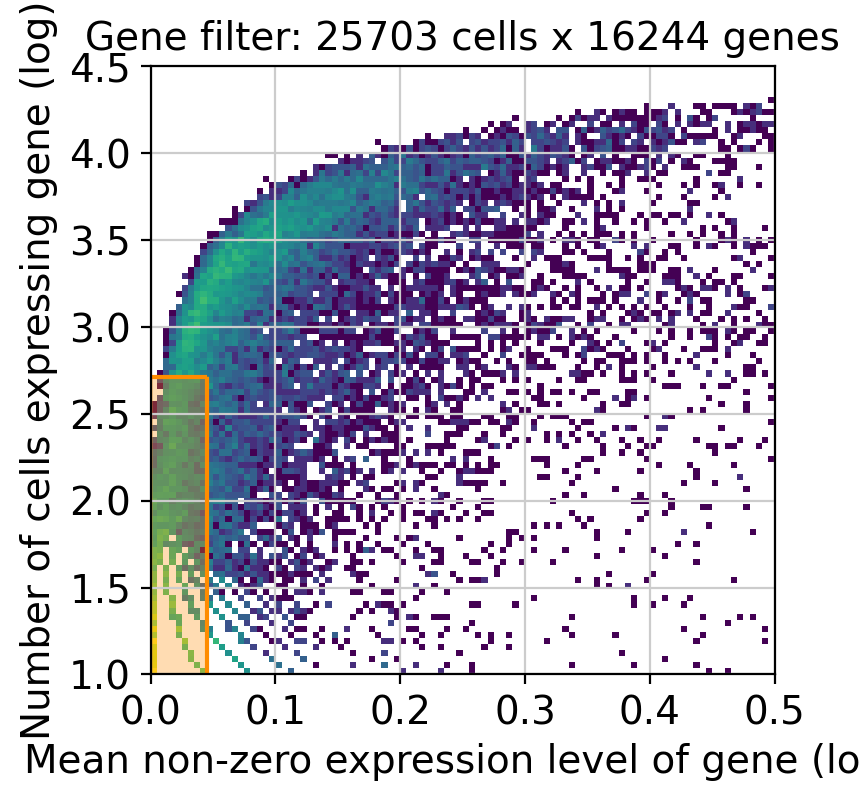

In [ ]:
selected = filter_genes(combined_adata, cell_count_cutoff=3, cell_percentage_cutoff2= 0.02, nonz_mean_cutoff=1.11)

In [ ]:
combined_adata = combined_adata[:, selected].copy()

In [ ]:
combined_adata.obs["subtype"].value_counts()

,count
subtype,
CD8$^{+}$T,9611
CD4$^{+}$T,6207
Myeloid cells,1201
STC2+myCAF,941
B cells,911
NK cells,818
Normal_Epi,766
Plasma cells,727
Pericytes,577


In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
from sklearn.utils import resample

TARGET_COUNT = 500
subtypes = combined_adata.obs["subtype"].unique()
resampled_indices = []

for subtype in subtypes:
    subtype_indices = combined_adata.obs[combined_adata.obs["subtype"] == subtype].index

    if len(subtype_indices) > TARGET_COUNT:
        sampled_indices = np.random.choice(subtype_indices, TARGET_COUNT, replace=False)

    elif len(subtype_indices) < TARGET_COUNT:
        sampled_indices = np.random.choice(subtype_indices, TARGET_COUNT, replace=True)

    else:
        sampled_indices = subtype_indices

    resampled_indices.extend(sampled_indices)

combined_adata_resampled = combined_adata[resampled_indices].copy()
print(combined_adata_resampled.obs["subtype"].value_counts())


subtype
ADH1B+CAF        500
B cells          500
CD4$^{+}$T       500
CD8$^{+}$T       500
COL15A1+CAF      500
DC               500
FAP$^{+}$EC      500
FLT1$^{+}$EC     500
ITGA5$^{+}$EC    500
Lympatic_EC      500
MT+Fibro         500
Mast cells       500
Myeloid cells    500
NK cells         500
Neutrophils      500
Normal_Epi       500
POSTN$^{+}$EC    500
Pericytes        500
Plasma cells     500
RGS5$^{+}$EC     500
RPL+Fibro        500
STC2+myCAF       500
immuetumor       500
stemEMCfhpz      500
stemhc           500
stemjxEMC        500
stemproEMC_C0    500
stemproEMC_C1    500
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [ ]:
combined_adata = combined_adata_resampled

In [ ]:
cell2location.models.RegressionModel.setup_anndata(adata=combined_adata, batch_key='Samples',labels_key='subtype')

/usr/local/lib/python3.11/dist-packages/scvi/data/fields/_layer_field.py:115: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.


In [ ]:
from cell2location.models import RegressionModel
mod = RegressionModel(combined_adata)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 1.3.0.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'Samples',
│   'labels_key': 'subtype',
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   6   │
│         n_cells          │ 14000 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │  28   │
│          n_vars          │ 16244 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location    ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Samples'] │    JA-1    │          0          │
│                      │    JA-2    │          1          │
│                      │    JA-3    │          2          │
│                      │   LCT-1    │          3          │
│                      │   LCT-2    │          4          │
│                      │   LCT-3    │          5          │
└──────────────────────┴────────────┴─────────────────────┘

                    labels State Registry                     
┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location    ┃  Categories   ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['subtype'] │   ADH1B+CAF   │          0          │
│                      │    B cells    │          1          │
│                      │  CD4$^{+}$T   │          2          │
│                      │  CD8$^{+}$T   │          3          │
│                      │  COL15A1+CAF  │          4          │
│                      │      DC       │          5          │
│                      │  FAP$^{+}$EC  │          6          │
│                      │ FLT1$^{+}$EC  │          7          │
│                      │ ITGA5$^{+}$EC │          8          │
│                      │  Lympatic_EC  │          9          │
│                      │   MT+Fibro    │         10          │
│                      │  Mast cells   │         11          │
│                      │ Myeloid cells │         12          │
│                      │   NK cells    │         13          │
│                      │  Neutrophils  │         14          │
│                      │  Normal_Epi   │         15          │
│                      │ POSTN$^{+}$EC │         16          │
│                      │   Pericytes   │         17          │
│                      │ Plasma cells  │         18          │
│                      │ RGS5$^{+}$EC  │         19          │
│                      │   RPL+Fibro   │         20          │
│                      │  STC2+myCAF   │         21          │
│                      │  immuetumor   │         22          │
│                      │  stemEMCfhpz  │         23          │
│                      │    stemhc     │         24          │
│                      │   stemjxEMC   │         25          │
│                      │ stemproEMC_C0 │         26          │
│                      │ stemproEMC_C1 │         27          │
└──────────────────────┴───────────────┴─────────────────────┘

In [ ]:
mod.train(max_epochs=250)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/trainer/configuration_validator.py:68: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
INFO: You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:lightning.pytorch.utilities.rank_zero:You are using a C

Training:   0%|          | 0/250 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=250` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=250` reached.


In [ ]:
import os
os.chdir('/content/drive/MyDrive/something/ST/')
results_folder = './results/cell2location/'

ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

os.makedirs(ref_run_name, exist_ok=True)
os.makedirs(run_name, exist_ok=True)

print(f"Created directories:\n{ref_run_name}\n{run_name}")


Created directories:
./results/cell2location//reference_signatures
./results/cell2location//cell2location_map


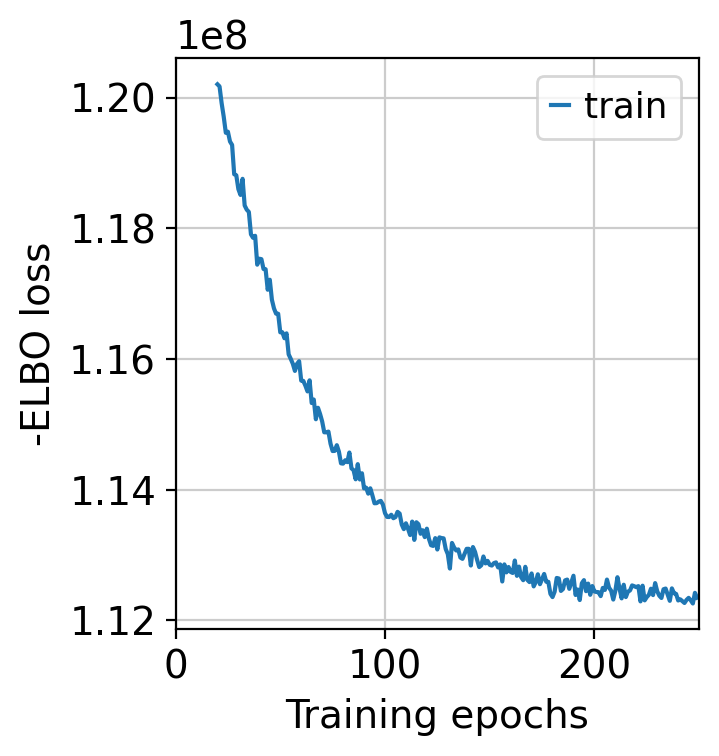

In [ ]:
mod.plot_history(20)

In [ ]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
combined_adata = mod.export_posterior(
    combined_adata, sample_kwargs={'num_samples': 1000, 'batch_size': 2500}
)

# Save model
mod.save(f"{ref_run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{ref_run_name}/sc.h5ad"
combined_adata.write(adata_file)
adata_file

Sampling local variables, batch:   0%|          | 0/6 [00:00<?, ?it/s]

Sampling global variables, sample:   0%|          | 0/999 [00:00<?, ?it/s]

'./results/cell2location//reference_signatures/sc.h5ad'

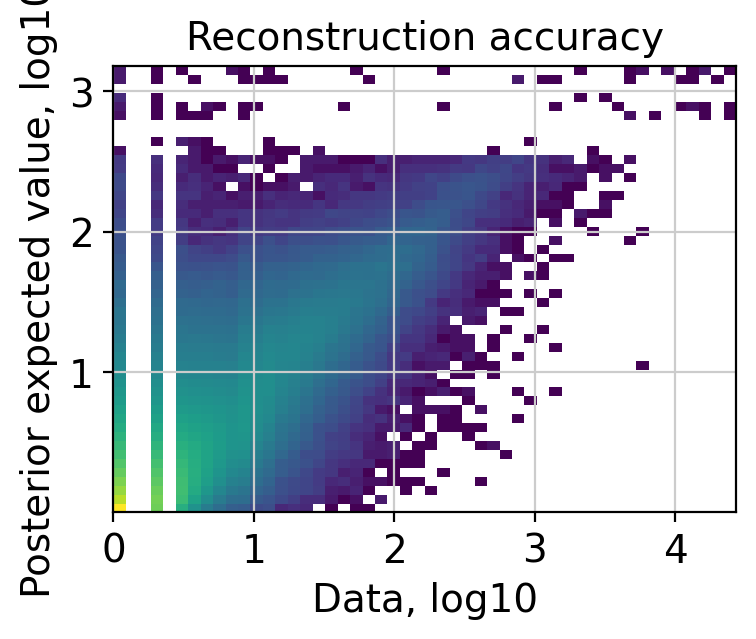

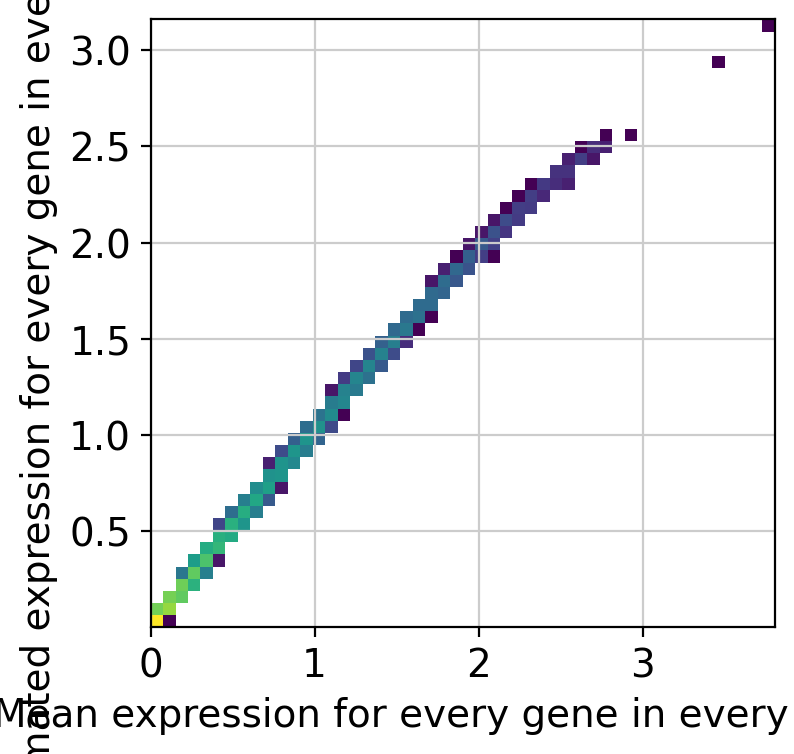

In [ ]:
mod.plot_QC()

In [ ]:
import os
os.chdir('/content/drive/MyDrive/something/ST/')
results_folder = './results/cell2location/'

ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

print(f"Created directories:\n{ref_run_name}\n{run_name}")
adata_file = f"{ref_run_name}/sc.h5ad"
combined_adata = sc.read_h5ad(adata_file)
mod = cell2location.models.RegressionModel.load(f"{ref_run_name}", combined_adata)

Created directories:
./results/cell2location//reference_signatures
./results/cell2location//cell2location_map
INFO     File ./results/cell2location//reference_signatures/model.pt already downloaded                            


/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
/usr/local/lib/python3.11/dist-packages/scvi/data/fields/_layer_field.py:115: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/trainer/configuration_validator.py:68: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
INFO: You are using a CUDA device ('NVIDIA A100-SXM4-40

Training:   0%|          | 0/1000 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=1` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1` reached.


In [ ]:
combined_adata = mod.export_posterior(
    combined_adata, use_quantiles=True,
    # choose quantiles
    add_to_varm=["q05","q50", "q95", "q0001"],
    sample_kwargs={'batch_size': 2500}
)

In [ ]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in combined_adata.varm.keys():
	inf_aver = combined_adata.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}' for i in combined_adata.uns['mod']['factor_names']]].copy()
else:
	inf_aver = combined_adata.var[[f'means_per_cluster_mu_fg_{i}' for i in combined_adata.uns['mod']['factor_names']]].copy()

inf_aver.columns = combined_adata.uns['mod']['factor_names']

inf_aver.shape

(16244, 28)

# run cell2location

### function

In [ ]:
def process_sample(sample_name):
    base_dir = "/content/drive/MyDrive/XYA/something/ST"
    outdir = os.path.join(base_dir, sample_name)

    if not os.path.exists(outdir):
        os.makedirs(outdir)
        print("dir make")
    else:
        print("dir maked")
    print(f"outdir: {outdir}")
    adata_vis = samples_dict.get(sample_name)
    if adata_vis is not None:
        print(f"succeed: {sample_name}")
        if 'counts' in adata_vis.layers:
            adata_vis.X = adata_vis.layers['counts'].copy()
            print("adata_vis.X has been successfully updated with counts from layers.")
        else:
            print("Error: 'counts' layer is not found in adata_vis.")
    else:
        print(f"no sample: {sample_name}")
        adata_vis = None

    return adata_vis, outdir

def prepare_and_train_cell2location(adata_vis, inf_aver):
    #adata_vis.obs['sample'] = list(adata_vis.uns['spatial'].keys())[0]
    adata_vis.var['MT_gene'] = adata_vis.var['SYMBOL'].apply(lambda gene: gene.startswith('MT-'))
    adata_vis.obsm['MT'] = adata_vis[:, adata_vis.var['MT_gene'].values].X.toarray()
    adata_vis = adata_vis[:, ~adata_vis.var['MT_gene'].values]

    adata_vis.var_names_make_unique()
    intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
    adata_vis = adata_vis[:, intersect].copy()
    inf_aver = inf_aver.loc[intersect, :].copy()
    cell2location.models.Cell2location.setup_anndata(adata=adata_vis, batch_key="sample")
    mod = cell2location.models.Cell2location(
        adata=adata_vis, cell_state_df=inf_aver,
        N_cells_per_location=20,
        detection_alpha=20
    )

    mod.view_anndata_setup()
    mod.train(max_epochs=30000, batch_size=None, train_size=1)

    mod.plot_history(1000)
    plt.legend(labels=['full data training'])
    plt.show()

    adata_vis = mod.export_posterior(adata_vis)
    mod.plot_QC()
    return adata_vis, mod


import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os

def save_results(adata_vis,
                 outdir,
                 sample):

    # 1) Put the original cell-abundance columns in adata_vis.obs
    #    so that sc.pl.spatial can plot them via color=...
    adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

    # 2) Create a per‐spot normalized version (row sums = 1).
    #    Note: We add a tiny epsilon before dividing to avoid zeros in the denominator if needed.
    abundance = adata_vis.obsm['q05_cell_abundance_w_sf']
    # Summation along axis=1 returns a Series; we reshape to (n_spots, 1) for broadcasting.
    row_sums = abundance.sum(axis=1).to_numpy().reshape(-1, 1)
    abundance_norm = abundance / np.maximum(row_sums, 1e-12)  # shape: [n_spots, n_cell_types]

    # 3) Store normalized matrix back in the AnnData object
    adata_vis.obsm['q05_cell_abundance_w_sf_norm'] = abundance_norm

    # 4) Make new columns in .obs for the normalized data
    #    so that each factor can be referenced as color= its factor name + "_norm"
    factor_names = adata_vis.uns['mod']['factor_names']  # list of cell‐type/factor names
    norm_names = [f"{f}_norm" for f in factor_names]     # the column names for the normalized data
    adata_vis.obs[norm_names] = abundance_norm

    # 5) Build a list of cell‐type names (must match the factor names in .obs if you want color=cells).
    #    If those strings match exactly adata_vis.uns['mod']['factor_names'] (in the same order),
    #    you can use factor_names. Otherwise, you can do something like below:
    cells = list(adata_vis.uns['mod']['factor_names'])
    # If you need the exact order from factor_names, you could instead do:
    # cells = factor_names

    # 6) Define colormaps you want to use for both original & normalized plots.
    colormaps = {
        "magma":"magma",
        "RdBu": "RdBu_r"
    }

    # 7) Plot the “original” abundances
    for name, cmap in colormaps.items():
        sc.pl.spatial(
            adata_vis,
            cmap=cmap,
            color=cells,                # the unscaled columns
            ncols=4,
            size=1.3,
            img_key='hires',
            vmin=0,
            vmax='p99.2',
            show=False
        )
        filename = f"spatial.celltype_{name}.png"
        plt.savefig(os.path.join(outdir, filename), bbox_inches='tight')
        plt.close()

    # 8) Plot the “per‐spot normalized” abundances
    #    Now we just point sc.pl.spatial to the *_norm columns.
    norm_cell_names = [f"{c}_norm" for c in cells]

    for name, cmap in colormaps.items():
        sc.pl.spatial(
            adata_vis,
            cmap=cmap,
            color=norm_cell_names,      # the normalized columns
            ncols=4,
            size=1.3,
            img_key='hires',
            vmin=0,
            vmax='p99.2',
            show=False
        )
        filename = f"spatial.celltype_{name}_norm.png"
        plt.savefig(os.path.join(outdir, filename), bbox_inches='tight')
        plt.close()

    # 9) Finally, save your AnnData object
    adata_vis.write(os.path.join(outdir, f"{sample}.spatial.cell2location.h5ad"))

    return adata_vis



def generate_annotation_dotplot(adata_vis, outdir, sample, annotations):
    adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']
    adata_vis.obsm['q05_cell_abundance_w_sf'].columns = [
        i.replace('q05cell_abundance_w_sf_', '') for i in adata_vis.obsm['q05_cell_abundance_w_sf'].columns
    ]
    annot_abundance_df = pd.DataFrame(index=adata_vis.uns['mod']['factor_names'], columns=annotations)

    for annot in annotations:
        ind = adata_vis.obs[annot] == True
        annot_abundance_df[annot] = adata_vis.obs.loc[ind, adata_vis.uns['mod']['factor_names']].mean(0)

    annot_abundance_norm = (annot_abundance_df.T / annot_abundance_df.sum(1)).T

    mpl.rc_file_defaults()
    mpl.rcParams['pdf.fonttype'] = 42

    with mpl.rc_context({'font.size': 8, 'axes.facecolor': "white"}):
        clustermap(annot_abundance_norm, figure_size=(12, 11), cmap='RdPu', log=True, fun_type='dotplot', cluster_rows=True, cluster_cols=True)
        plt.savefig(os.path.join(outdir, f"{sample}.histology_annotation_dotplot.pdf"), bbox_inches='tight')

def generate_annotation_dotplot_ct(adata_vis, outdir, sample, annotations):
    adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']
    adata_vis.obsm['q05_cell_abundance_w_sf'].columns = [
        i.replace('q05cell_abundance_w_sf_', '') for i in adata_vis.obsm['q05_cell_abundance_w_sf'].columns
    ]

    annot_abundance_df = pd.DataFrame(index=adata_vis.uns['mod']['factor_names'], columns=annotations)
    print(annot_abundance_df)
    for annot in annotations:
        ind = adata_vis.obs[annot] == True
        annot_abundance_df[annot] = adata_vis.obs.loc[ind, adata_vis.uns['mod']['factor_names']].mean(0)

    annot_abundance_norm = (annot_abundance_df.T / annot_abundance_df.sum(1)).T

    mpl.rc_file_defaults()
    mpl.rcParams['pdf.fonttype'] = 42  # enables correct plotting of text

    with mpl.rc_context({'font.size': 8, 'axes.facecolor': "white"}):
        clustermap(annot_abundance_norm, figure_size=(12, 11), cmap='RdPu', log=True, fun_type='dotplot', cluster_rows=True, cluster_cols=True)
        plt.savefig(os.path.join(outdir, f"{sample}.histology_annotation_dotplot_ctniche.pdf"), bbox_inches='tight')


def run_misty_analysis(adata_vis, outdir, sample):
    try:
        print("Step 1: Extracting and adjusting cell abundance data...")

        abundance_data = adata_vis.obsm["q05_cell_abundance_w_sf"]
        new_column_names = [col.replace("q05cell_abundance_w_sf_", "") for col in abundance_data.columns]
        abundance_data.columns = new_column_names

        adata_vis.obsm["composition"] = abundance_data
        print("Step 1 completed successfully!")
    except Exception as e:
        print(f"[Error in Step 1] {e}")
        print("Skipping to the next step...")

    try:
        print("Step 2: Basic preprocessing and spatial plotting...")
        adata = adata_vis.copy()
        adata.layers['counts'] = adata.X.copy()
        sc.pp.normalize_total(adata, target_sum=1e4)
        sc.pp.log1p(adata)
        if 'leiden' not in adata.obs.columns:
            print("Warning: 'leiden' cluster not found in adata.obs. The spatial plot may not show cluster colors.")
            color_list = [None]
        else:
            color_list = [None, 'leiden']
        sc.pl.spatial(adata, color=color_list, size=1.3, palette='Set1', show=False)
        plt.savefig(outdir + '/' + sample + '.spatial.niche.png', bbox_inches='tight', dpi=500)
        plt.close()
        print(f"Spatial plot saved to: {outdir}/{sample}.spatial.niche.png")
        print("Step 2 completed successfully!")
    except Exception as e:
        print(f"[Error in Step 2] {e}")
        print("Skipping to the next step...")
    try:
        print("Step 3: Cell-cell interaction with MISTy...")
        comps = li.ut.obsm_to_adata(adata, 'composition')
        misty = genericMistyData(intra=comps, extra=comps, cutoff=0.05, bandwidth=200, n_neighs=6)
        misty(model=RandomForestModel, n_jobs=32, verbose=False)

        fig_contrib = liana.plotting.contributions(misty, figure_size=(25, 10), return_fig=True)
        print("Displaying figure: contributions")
        fig_contrib.draw()
        fig_contrib.save(
            filename=outdir + '/' + sample + '.misty.cellcell.contri.juxta.png',
            format='png', dpi=600, bbox_inches='tight'
        )
        fig_cc = (
            li.pl.interactions(misty, view='juxta', return_fig=True, figure_size=(10, 8))
            + p9.scale_fill_distiller(palette="BuPu")
        )
        print("Displaying figure: celltype.colocalization")
        fig_cc.draw()
        fig_cc.save(
            filename=outdir + '/' + sample + '.misty.colo.juxta.png',
            format='png', dpi=600, bbox_inches='tight'
        )
        print(f"Cell-cell interaction figure saved to: {outdir}/{sample}.misty.colo.juxta.png")

        fig_cc = (
            li.pl.interactions(misty, view='intra', return_fig=True, figure_size=(10, 8))
            + p9.scale_fill_distiller(palette="BuPu")
        )
        print("Displaying figure: celltype.colocalization")
        fig_cc.draw()
        fig_cc.save(
            filename=outdir + '/' + sample + '.misty.colo.intra.png',
            format='png', dpi=600, bbox_inches='tight'
        )
        print(f"Cell-cell interaction figure saved to: {outdir}/{sample}.spatial.misty.spatial.celltype.colocalization.png")

        print("Step 3 completed successfully!")
    except Exception as e:
        print(f"[Error in Step 3] {e}")
        print("Skipping to the next step...")

    try:
        print("Step 4: Pathway level analysis with Progeny...")

        progeny = dc.get_progeny(organism='human', top=500)

        if 'SYMBOL' not in adata.var.columns:
            print("Warning: 'SYMBOL' is not in adata.var.columns. This might cause mismatch in gene names.")
        adata.var.set_index('SYMBOL', drop=False, inplace=True)

        dc.run_mlm(
            mat=adata,
            net=progeny,
            source='source',
            target='target',
            weight='weight',
            verbose=False,
            use_raw=False
        )

        acts_progeny = li.ut.obsm_to_adata(adata, 'mlm_estimate')
        misty = genericMistyData(intra=comps, extra=acts_progeny, cutoff=0.05, bandwidth=200, n_neighs=6)
        misty(model=RandomForestModel, n_jobs=32, verbose=False)

        fig_contrib = liana.plotting.contributions(misty, figure_size=(25, 10), return_fig=True)
        print("Displaying figure: contributions")
        fig_contrib.draw()
        fig_contrib.save(
            filename=outdir + '/' + sample + '.misty.Path.contri.png',
            format='png', dpi=600, bbox_inches='tight'
        )
        print(f"Contributions figure saved to: {outdir}/{sample}.misty.Path.contri.png")

        fig_pathway = (
            li.pl.interactions(misty, view='juxta', return_fig=True, figure_size=(14, 14))
            + p9.scale_fill_distiller(palette="BuPu")
        )
        print("Displaying figure: pathway")
        fig_pathway.draw()
        fig_pathway.save(
            filename=outdir + '/' + sample + '.misty.pathway.juxta.png',
            format='png', dpi=600, bbox_inches='tight'
        )

        fig_pathway = (
            li.pl.interactions(misty, view='intra', return_fig=True, figure_size=(14, 14))
            + p9.scale_fill_distiller(palette="BuPu")
        )
        print("Displaying figure: pathway")
        fig_pathway.draw()
        fig_pathway.save(
            filename=outdir + '/' + sample + '.misty.pathway.intra.png',
            format='png', dpi=600, bbox_inches='tight'
        )


        print(f"Pathway interaction figure saved to: {outdir}/{sample}.pathway.png")
        print("Step 4 completed successfully!")
    except Exception as e:
        print(f"[Error in Step 4] {e}")
        print("Skipping to the next step...")

    try:
        print("Step 5: Transcription Factor analysis with collectri...")

        net = dc.get_collectri()

        dc.run_ulm(mat=adata, net=net, verbose=False, use_raw=False)

        acts_tfs = li.ut.obsm_to_adata(adata, 'ulm_estimate')

        li.ut.spatial_neighbors(acts_tfs, cutoff=0.1, bandwidth=200, set_diag=False)

        acts_progeny.obsm['spatial'] = acts_tfs.obsm['spatial']
        acts_progeny.obsp['spatial_connectivities'] = acts_tfs.obsp['spatial_connectivities']

        misty = MistyData(data={"intra": comps, "TFs": acts_tfs, "Pathways": acts_progeny})
        misty(model=LinearModel, verbose=False, bypass_intra=True)

        fig_tfs = (
            li.pl.interactions(misty, view='TFs', top_n=50, figure_size=(40, 20))
            + p9.labs(x='Transcription Factor', y='Cell type')
            + p9.theme_bw(base_size=14)
            + p9.theme(
                axis_text_x=p9.element_text(rotation=90, size=5),
                axis_text_y=p9.element_text(size=10)
            )
            + p9.scale_fill_gradient2(low='blue', mid='white', high='red')
        )
        print("Displaying figure: TF")
        fig_tfs.draw()
        fig_tfs.save(
            filename=outdir + '/' + sample + '.spatial.misty.spatial.TF.png',
            format='png', dpi=600, bbox_inches='tight'
        )
        print(f"TF interaction figure saved to: {outdir}/{sample}.spatial.misty.spatial.TF.png")
        print("Step 5 completed successfully!")
    except Exception as e:
        print(f"[Error in Step 5] {e}")
        print("Skipping to the next step...")


    try:
        print("Step 6: Ligand-Receptor analysis...")

        sc.pp.highly_variable_genes(
            adata,
            n_top_genes=None,
            min_disp=0.1,
            max_disp=float('inf'),
            min_mean=0.01,
            max_mean=10,
            subset=False
        )

        hvg = adata.var[adata.var['highly_variable']].index

        misty = lrMistyData(
            adata[:, hvg],
            bandwidth=200,
            set_diag=False,
            cutoff=0.01,
            nz_threshold=0.1
        )
        misty(bypass_intra=True, model=LinearModel, verbose=False)

        fig_lr = (
            li.pl.interactions(misty, view='extra', return_fig=True, figure_size=(12, 10), top_n=25, key=abs)
            + p9.scale_fill_distiller(palette="BuPu")
            + p9.labs(y='Receptor', x='Ligand')
        )
        print("Displaying figure: LR")
        fig_lr.draw()
        fig_lr.save(
            filename=outdir + '/' + sample + '.spatial.misty.spatial.LR.png',
            format='png', dpi=600, bbox_inches='tight'
        )
        print(f"LR interaction figure saved to: {outdir}/{sample}.spatial.misty.spatial.LR.png")
        print("Step 6 completed successfully!")
    except Exception as e:
        print(f"[Error in Step 6] {e}")
        print("Skipping to the next step...")

    print("All misty analyses attempted (with each step in try-except).")

In [ ]:
ScPyPy.gene_ids_2ad(adata_concat)

         n_cells         gene_ids
SAMD11       169  ENSG00000187634
NOC2L       3207  ENSG00000188976
KLHL17       655  ENSG00000187961
PLEKHN1     2218  ENSG00000187583
PERM1         65  ENSG00000187642
Gene IDs successfully added to adata.var


In [ ]:
adata_concat.var['SYMBOL'] = adata_concat.var.index
adata_concat.var.set_index('gene_ids', drop=True, inplace=True)

In [ ]:
ST_RAW_COUNTS = adata_concat

Anndata setup with scvi-tools version 1.3.0.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   2   │
│         n_cells          │ 4499  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 13278 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │    HC36    │          0          │
│                     │    HC95    │          1          │
└─────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/trainer/configuration_validator.py:68: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: PossibleUserWarning: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader

Training:   0%|          | 0/30000 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=30000` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30000` reached.


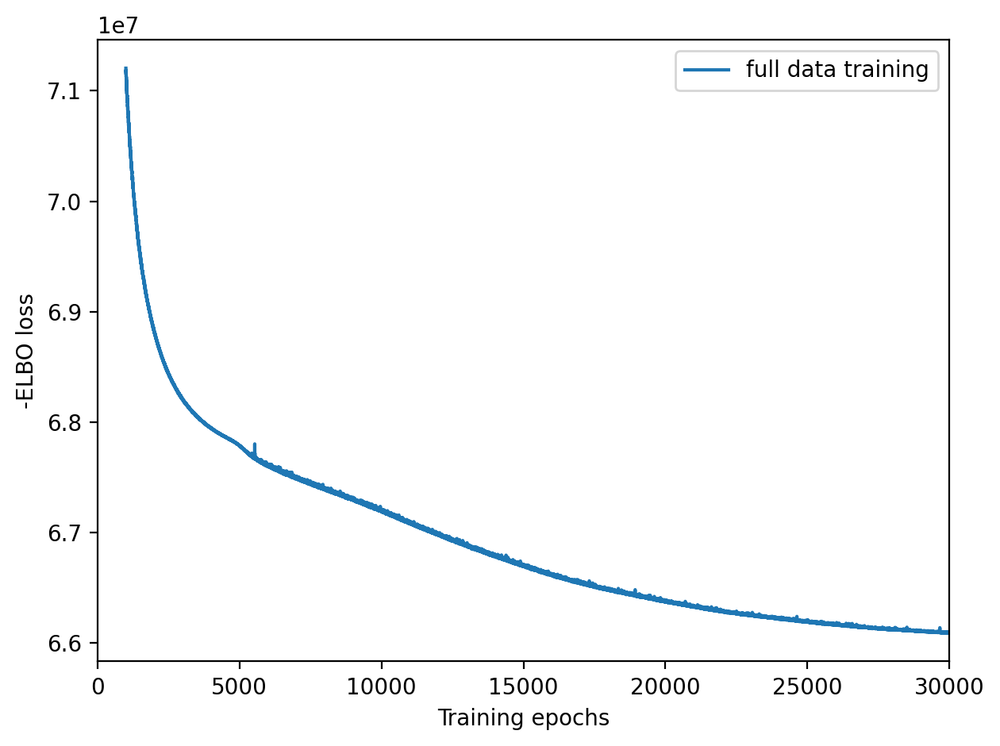

Sampling local variables, batch:   0%|          | 0/36 [00:00<?, ?it/s]

Sampling global variables, sample:   0%|          | 0/999 [00:00<?, ?it/s]

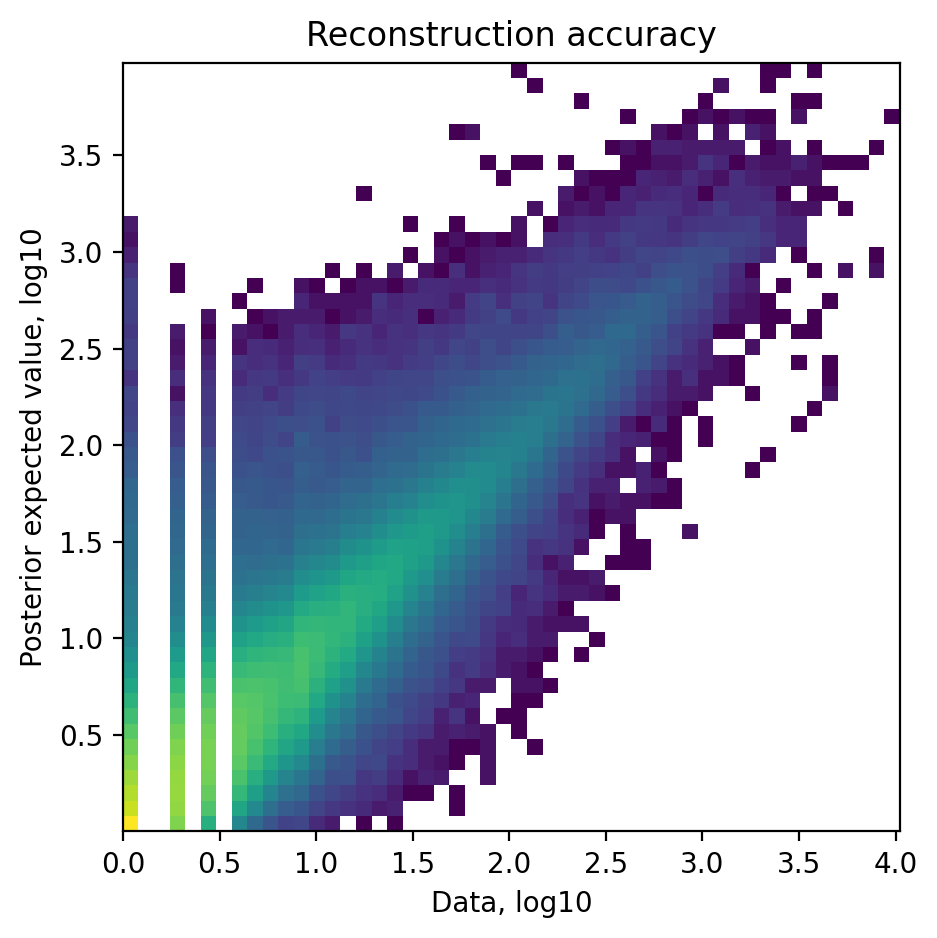

In [ ]:
adata_concat, mod = prepare_and_train_cell2location(adata_concat, inf_aver)

In [ ]:

import os
os.chdir('/content/drive/MyDrive/something/ST/')
results_folder = './results/cell2location/'
sp_run_name = f'{results_folder}/cell2location_sp'

os.makedirs(sp_run_name, exist_ok=True)

print(f"Created directories:\n{sp_run_name}")

# Save model
mod.save(f"{sp_run_name}", overwrite=True)

mod = cell2location.models.Cell2location.load(f"{sp_run_name}", adata_concat)

# Save anndata object with results
adata_file = f"{sp_run_name}/sp.h5ad"
adata_concat.write(adata_file)
adata_file
fig = mod.plot_spatial_QC_across_batches()

In [ ]:
os.chdir('/content/drive/MyDrive/XYA/something/ST/')
results_folder = './results/cell2location/'
sp_run_name = f'{results_folder}/cell2location_sp'
# Save anndata object with results
adata_file = f"{sp_run_name}/sp.h5ad"
#adata_concat.write(adata_file)
os.makedirs(sp_run_name, exist_ok=True)
print(f"Created directories:\n{sp_run_name}")
# Save model
#mod.save(f"{sp_run_name}", overwrite=True)
adata_concat = sc.read_h5ad(adata_file)

Created directories:
./results/cell2location//cell2location_sp


INFO     File ./results/cell2location//cell2location_sp/model.pt already downloaded                                


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/trainer/configuration_validator.py:68: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
INFO: You are using a CUDA device ('NVIDIA L4') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:lightning.pytorch.utilities.rank_zero:You are using a CUDA device (

Training:   0%|          | 0/30000 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=1` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1` reached.
/usr/local/lib/python3.11/dist-packages/cell2location/models/_cell2location_model.py:435: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
/usr/local/lib/python3.11/dist-packages/cell2location/models/_cell2location_model.py:435: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
/usr/local/lib/python3.11/dist-packages/cell2location/models/_cell2location_model.py:435: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
/usr/local/lib/python3.11/dist-packages/cell2location/models/_cell2location_model.py:435: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
/usr/local/lib/python3.11/dist-packages/cell2location/models/_cell2location_model.py:456: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
/usr/local/lib/python3.11/dist-packages/cell2location/models/_cell2location_model.py:456: FutureWarning: Use `squidpy.pl.spa

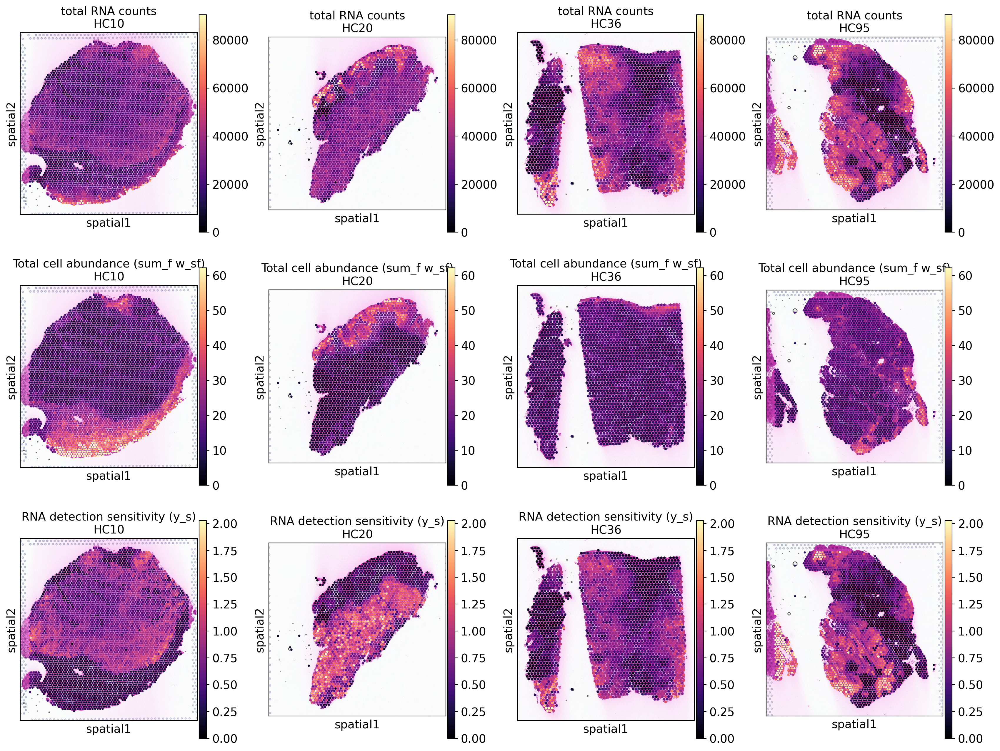

In [ ]:
mod = cell2location.models.Cell2location.load(f"{sp_run_name}", adata_concat)
fig = mod.plot_spatial_QC_across_batches()

In [ ]:
outdir = "/content/drive/MyDrive/ST"
#adata_concat.write_h5ad(f"{outdir}/combined_harmony_ST_cell2location_major_type.h5ad")

In [ ]:
adata_concat = sc.read_h5ad(f"{outdir}/combined_harmony_ST_cell2location_major_type.h5ad")

In [ ]:
print(adata_concat.X)

  (0, 11124)	7.0
  (0, 11058)	1.0
  (0, 10993)	1.0
  (0, 11043)	14.0
  (0, 4969)	3.0
  (0, 10944)	1.0
  (0, 1241)	32.0
  (0, 9954)	2.0
  (0, 10642)	1.0
  (0, 7735)	7.0
  (0, 4968)	2.0
  (0, 9241)	2.0
  (0, 4557)	14.0
  (0, 12062)	1.0
  (0, 2724)	1.0
  (0, 7951)	1.0
  (0, 9929)	27.0
  (0, 12051)	6.0
  (0, 10252)	1.0
  (0, 7734)	21.0
  (0, 12100)	4.0
  (0, 11405)	4.0
  (0, 12299)	3.0
  (0, 11168)	6.0
  (0, 12014)	1.0
  :	:
  (9930, 11655)	1.0
  (9930, 1554)	1.0
  (9930, 9584)	4.0
  (9930, 10649)	7.0
  (9930, 11320)	27.0
  (9930, 2144)	2.0
  (9930, 350)	1.0
  (9930, 13286)	6.0
  (9930, 1013)	1.0
  (9930, 11699)	3.0
  (9930, 1018)	2.0
  (9930, 4886)	1.0
  (9930, 11330)	2.0
  (9930, 2150)	1.0
  (9930, 4552)	1.0
  (9930, 1019)	4.0
  (9930, 7754)	3.0
  (9930, 12466)	6.0
  (9930, 4885)	2.0
  (9930, 10500)	1.0
  (9930, 7402)	1.0
  (9930, 7403)	1.0
  (9930, 13135)	2.0
  (9930, 884)	1.0
  (9930, 335)	1.0


In [ ]:
# Get posterior distribution samples for specific variables
samples_w_sf = mod.sample_posterior(num_samples=1000, return_samples=True,
                                    batch_size=2025,
                                    return_sites=['w_sf', 'm_g', 'u_sf_mRNA_factors'])
# samples_w_sf['posterior_samples'] contains 1000 samples as arrays with dim=(num_samples, ...)
samples_w_sf['posterior_samples']['w_sf'].shape

Sampling local variables, batch:   0%|          | 0/5 [00:00<?, ?it/s]

Sampling global variables, sample:   0%|          | 0/999 [00:00<?, ?it/s]

(1000, 9931, 37)

Sampling local variables, batch:   0%|          | 0/78 [00:00<?, ?it/s]

Sampling global variables, sample:   0%|          | 0/999 [00:00<?, ?it/s]

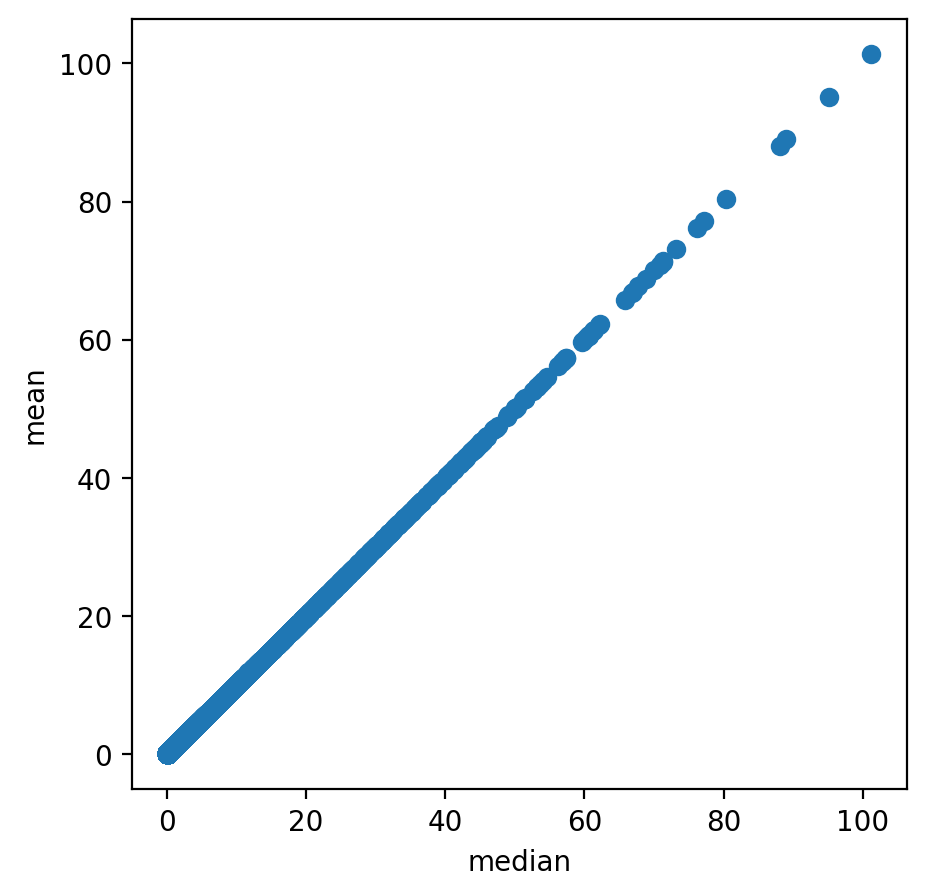

In [ ]:
# Compute any quantile of the posterior distribution
medians = mod.posterior_quantile(q=0.5, batch_size=mod.adata.n_obs)
mod.export_posterior(adata_concat)
with mpl.rc_context({'axes.facecolor':  'white',
                     'figure.figsize': [5, 5]}):
    plt.scatter(medians['w_sf'].flatten(), mod.samples['post_sample_means']['w_sf'].flatten());
    plt.xlabel('median');
    plt.ylabel('mean');

### 作图

In [ ]:
adata_concat

AnnData object with n_obs × n_vars = 4499 × 17498
    obs: 'in_tissue', 'array_row', 'array_col', 'sample_type', 'smoking_status', 'sample', 'mol_leiden', 'mol_niche', '_indices', '_scvi_batch', '_scvi_labels', 'total RNA counts', 'Total cell abundance (sum_f w_sf)', 'RNA detection sensitivity (y_s)'
    var: 'n_cells', 'SYMBOL', 'MT_gene'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'mol_leiden', 'sample_colors', 'sample_type_colors', 'smoking_status_colors', 'mol_leiden_colors', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'spatial', 'X_pca', 'X_pca_harmony', 'X_umap', 'MT', 'means_cell_abundance_w_sf', 'stds_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [ ]:
samples_dict = {}

for sample_name in unique_samples:
    adata_sample = adata_concat[adata_concat.obs['sample'] == sample_name].copy()
    if 'spatial' in adata_sample.uns:
        adata_sample.uns['spatial'] = {k: v for k, v in adata_sample.uns['spatial'].items() if k == sample_name}
    samples_dict[sample_name] = adata_sample
    print(f"Sample {sample_name}: {adata_sample.n_obs} cells, {adata_sample.n_vars} genes")

for sample_name in unique_samples:
    print(f"===== starting: {sample_name} =====")

    base_dir = "/content/drive/MyDrive/ST/results"
    outdir = os.path.join(base_dir, sample_name)

    if not os.path.exists(outdir):
        os.makedirs(outdir)
    else:
    print(f"outdir: {outdir}")

    adata_vis = samples_dict.get(sample_name)
    if adata_vis is not None:
        print(f"succeed: {sample_name}")
        if 'counts' in adata_vis.layers:
            adata_vis.X = adata_vis.layers['counts'].copy()
            print("adata_vis.X has been successfully updated with counts from layers.")
        else:
            print("Error: 'counts' layer is not found in adata_vis.")
    else:
        print(f"f: {sample_name}")
        adata_vis = None


    adata_vis = save_results(adata_vis,outdir, sample_name)

    adata_vis.obs['mol_niche'] = adata_vis.obs['mol_niche'].astype(str)

    leiden_categories = adata_vis.obs['mol_niche'].unique()
    for category in leiden_categories:
        new_column_name = f"{category}"
        adata_vis.obs[new_column_name] = (adata_vis.obs['mol_niche'] == category)

    base_len = len('mol_niche')
    annotations = [col for col in adata_vis.obs.columns if col.startswith('mol_niche') and len(col) > base_len]

    generate_annotation_dotplot(adata_vis, outdir, sample_name, annotations)
    run_misty_analysis(adata_vis, outdir, sample_name)

    print(f"=====  {sample_name} done =====\n")